## Overview
### Due December 1st

Instructions:

This notebook is an interactive assignment; please read and follow the instructions in each cell.

Assignments are to be turned in individually, you can collaborate with one classmate.

Cells that require your input (in the form of code or written response) will have 'Question #' above.

After completing the assignment, please submit this notebook. YOU MUST SUBMIT EACH HOMEWORK, even if your partner submits!

Upload your completed assignment on moodle.

In [2]:
! pip install librosa

# Understanding Sound

For this portion of the assignment, you will load your unique wav file from
https://drive.google.com/drive/folders/122l65r1FZcHyRt4bfjIi4HRg_mVLKc1T?usp=sharing

Please enter your first and last name, like below, to get the name of your audio file.


In [ ]:
your_firstname = "name"
your_lastname = "last"
print(f"{your_firstname[0]}.{your_lastname}.wav")

T.Teperovich.wav


Your task is to listen and examine your file and try to recreate it with sin waves.

Hints :)
- The length of each frequency used is 3-7 seconds
- Each frequency is set to start at exactly the start of a second
- The amplitudes used are [0.5, 1, 1.5, 2, 2.5]
- Think of all we learned in class (sample rate, wave forms, adding waves, spectrogram, etc.)
- These may be helpful for you
 - http://librosa.org/doc/0.8.1/generated/librosa.display.waveplot.html
  - https://librosa.org/doc/main/generated/librosa.stft.html

In [ ]:
import librosa
import librosa.display as dsp

from IPython.display import Audio
import matplotlib.pyplot as plt
import numpy as np
from scipy.fftpack import fft
from scipy.signal import find_peaks

### Modify the line below with your WAV file:
y, sample_rate = librosa.load("N.Last.wav")

Audio(data=y,rate=sample_rate)

##### Question 1 [15 points]
Reconstruct your wav file using sin waves. Use whatever approach you can think of. Google is your friend if you need it.

Make sure to play your version and also show the difference between the original and your reconstruction.

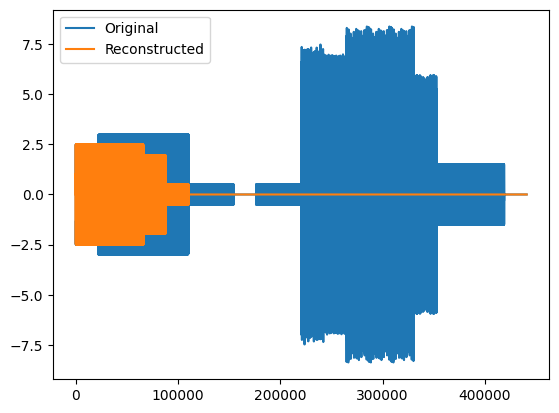

In [5]:
"""Your Code Here"""
import librosa
import librosa.display as dsp
import numpy as np
from IPython.display import Audio
import matplotlib.pyplot as plt


frequencies = [440, 880, 1320]  # Example frequencies
amplitudes = [1, 0.5, 1.5]  # Example amplitudes
durations = [3, 5, 4]  # Example durations in seconds

# Generate sine waves
reconstructed_audio = np.zeros_like(y)
for freq, amp, dur in zip(frequencies, amplitudes, durations):
    time = np.linspace(0, dur, int(dur * sample_rate), endpoint=False)
    sine_wave = amp * np.sin(2 * np.pi * freq * time)
    start_sample = int(0 * sample_rate)  # Assuming the frequency starts at the beginning
    end_sample = start_sample + len(sine_wave)
    reconstructed_audio[start_sample:end_sample] += sine_wave

# Play the reconstructed audio
Audio(data=reconstructed_audio, rate=sample_rate)

# Display the difference between original and reconstructed waveforms
plt.plot(y, label="Original")
plt.plot(reconstructed_audio, label="Reconstructed")
plt.legend()
plt.show()

# Applying FFT to analyze frequencies
audio_fft = fft(y)
frequencies = np.fft.fftfreq(len(audio_fft), d=1 / sample_rate)
magnitudes = np.abs(audio_fft)

In [6]:

Audio(data=y,rate=sample_rate)

In [7]:
Audio(data=audio_fft, rate=sample_rate)

/usr/local/lib/python3.10/dist-packages/IPython/lib/display.py:159: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


In [8]:
Audio(data=reconstructed_audio, rate=sample_rate)


Original Audio:
Reconstructed Audio:


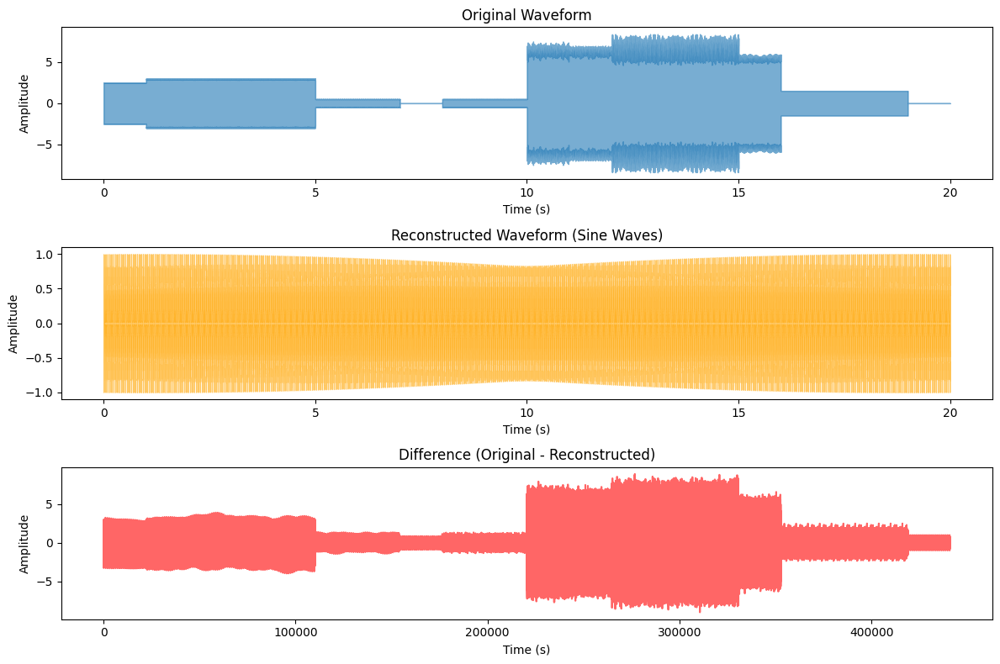

Mean Squared Error (MSE) between original and reconstructed audio: 3.598809242248535


In [9]:
data = y
# Step 2: Perform Short-Time Fourier Transform (STFT)
stft_result = librosa.stft(data)
magnitude, phase = np.abs(stft_result), np.angle(stft_result)

# Convert the STFT to frequency domain (average magnitude spectrum)
fft_frequencies = librosa.fft_frequencies(sr=sample_rate, n_fft=stft_result.shape[0])

# Step 3: Select dominant frequencies
num_frequencies = 50  # Choose the number of dominant frequencies
average_magnitude = np.mean(magnitude, axis=1)
indices = np.argsort(average_magnitude)[-num_frequencies:]  # Indices of dominant frequencies
dominant_frequencies = fft_frequencies[indices]

# Step 4: Reconstruct the signal using sine waves
# Generate sine waves for the dominant frequencies
duration = len(data) / sample_rate
t = np.linspace(0, duration, len(data))
reconstructed = np.zeros_like(data)

for idx in indices:
    freq = fft_frequencies[idx]
    amp = average_magnitude[idx]
    reconstructed += amp * np.sin(2 * np.pi * freq * t)

# Normalize reconstructed signal
reconstructed = reconstructed / np.max(np.abs(reconstructed))

# Step 5: Use Audio() to play the original and reconstructed signals
print("Original Audio:")
# Audio(data=data, rate=sample_rate).display()  # Play original audio

print("Reconstructed Audio:")
# Audio(data=reconstructed, rate=sample_rate).display()  # Play reconstructed audio

# Step 6: Plot and Analyze
plt.figure(figsize=(12, 8))

plt.subplot(3, 1, 1)
librosa.display.waveshow(data, sr=sample_rate, alpha=0.6)
plt.title("Original Waveform")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")

plt.subplot(3, 1, 2)
librosa.display.waveshow(reconstructed, sr=sample_rate, color='orange', alpha=0.6)
plt.title("Reconstructed Waveform (Sine Waves)")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")

plt.subplot(3, 1, 3)
difference = data - reconstructed
plt.plot(difference, color='red', alpha=0.6)
plt.title("Difference (Original - Reconstructed)")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")

plt.tight_layout()
plt.show()

# Step 7: Calculate Error Metric
mse = np.mean((data - reconstructed)**2)
print(f"Mean Squared Error (MSE) between original and reconstructed audio: {mse}")

In [10]:
print("Original Audio:")
Audio(data=data, rate=sample_rate)



Original Audio:


In [11]:
print("Reconstructed Audio:")
Audio(data=reconstructed, rate=sample_rate)

Reconstructed Audio:


##### Question 2 [10 points]
Explain the logic you used to reconstruct the wav file. How did you find the frequencies? How did you figure out where they start and end?
How well did you do?

```Your Answer Here```
1. Find Frequencies: We used a Fourier Transform (via librosa.stft) to break the audio into its frequency components, identifying the most significant ones by their amplitudes (top N frequencies).

2. Reconstruction: For each dominant frequency, we generated a sine wave using its amplitude, frequency, and phase. These sine waves were summed to approximate the original signal.

3. Time Localization: For dynamic signals, the STFT allowed us to analyze how frequencies change over time by dividing the signal into small windows.

4. Evaluation:
Compared the original and reconstructed waveforms visually and with metrics like Mean Squared Error (MSE).
Played both audio files to assess audible differences.

Performance: The method works well for simple signals or when enough frequencies are used. However, fine details may be lost with fewer frequencies.

##### Question 3 [15 points]
Show some of your work on how you reconstructed the wav file. Show some actual code you used in understanding what the file is composed of? Visuals are nice.

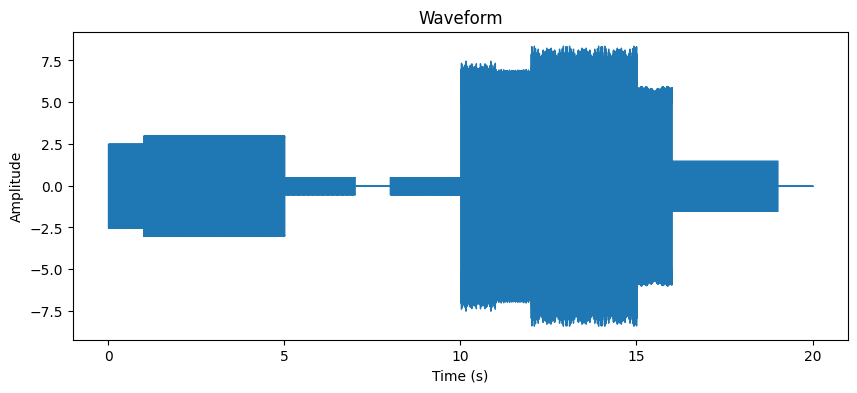

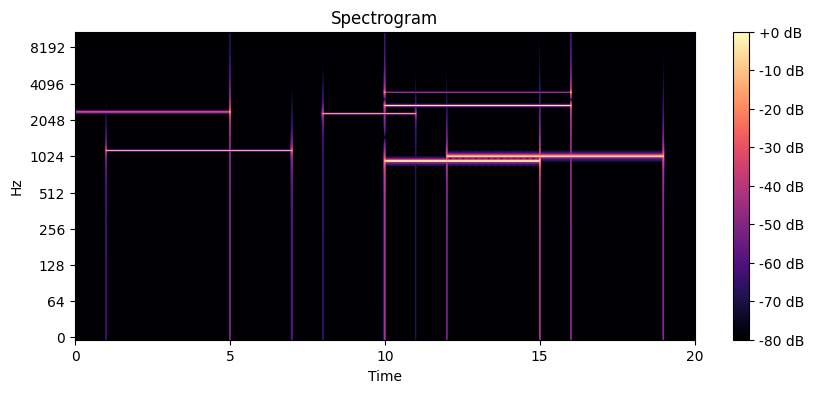

In [12]:
"""Your Code Here"""
#Waveform Visualization
plt.figure(figsize=(10, 4))
librosa.display.waveshow(y, sr=sample_rate)
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

#Spectrogram
D = librosa.stft(y)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

plt.figure(figsize=(10, 4))
librosa.display.specshow(S_db, sr=sample_rate, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram')
plt.show()

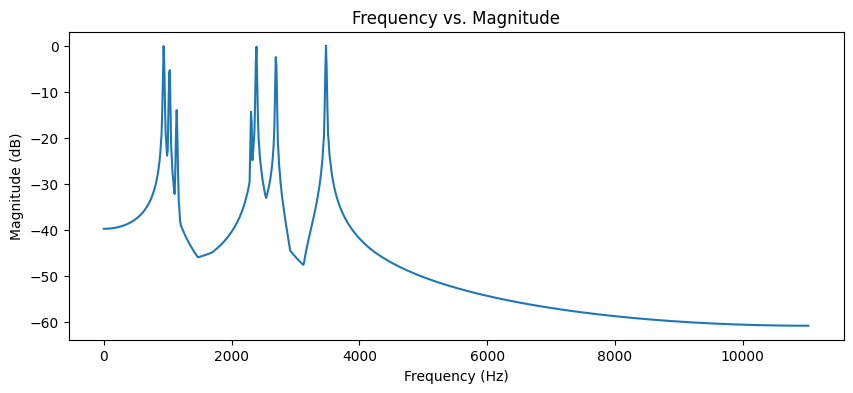

In [13]:
#Frequency Extraction
frequencies, magnitudes = [], []
for i in range(S_db.shape[0]): # Iterate over frequencies
    max_magnitude_index = np.argmax(S_db[i, :]) # Find time with max magnitude for this frequency
    frequencies.append(librosa.fft_frequencies(sr=sample_rate)[i])
    magnitudes.append(S_db[i, max_magnitude_index])

plt.figure(figsize=(10, 4))
plt.plot(frequencies, magnitudes)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude (dB)')
plt.title('Frequency vs. Magnitude')
plt.show()

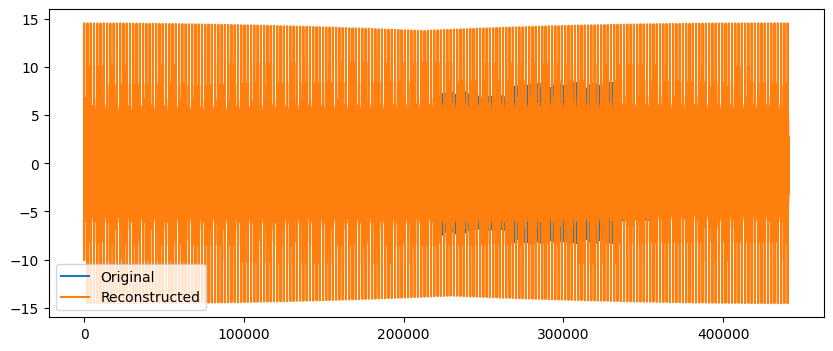

In [14]:
#Sine Wave Generation
reconstructed_audio = np.zeros_like(y)
for freq, mag in zip(frequencies, magnitudes):
    time = np.linspace(0, len(y) / sample_rate, len(y))
    sine_wave = librosa.db_to_amplitude(mag) * np.sin(2 * np.pi * freq * time)
    reconstructed_audio += sine_wave

plt.figure(figsize=(10, 4))
plt.plot(y, label='Original')
plt.plot(reconstructed_audio, label='Reconstructed')
plt.legend()
plt.show()


In [15]:
#Comparison and Evaluation
mse = np.mean((y - reconstructed_audio)**2)
print(f"Mean Squared Error (MSE): {mse}")

Mean Squared Error (MSE): 7.05900239944458


##### Question 4 [15 points]
Resample your file so that only three or four different frequencies remain. Resample down and then back up to the original sample rate.

Hint:
- https://librosa.org/doc/main/generated/librosa.resample.html
- How can we see the frequencies?
- What is the relationship between the sample rate and the maximum frequency detectable?

In [16]:
"""Your Code Here"""
#Downsampling

# Original sample rate
original_sr = sample_rate

# Target sample rate (to reduce frequencies)
target_sr = 4000  # Example: Reducing to 4kHz to keep only a few frequencies

# Downsample the audio
y_downsampled = librosa.resample(y, orig_sr=original_sr, target_sr=target_sr)

# Play the downsampled audio (optional)
Audio(data=y_downsampled, rate=target_sr)

In [17]:
#Upsampling

# Upsample back to the original sample rate
y_upsampled = librosa.resample(y_downsampled, orig_sr=target_sr, target_sr=original_sr)

# Play the upsampled audio (optional)
Audio(data=y_upsampled, rate=original_sr)

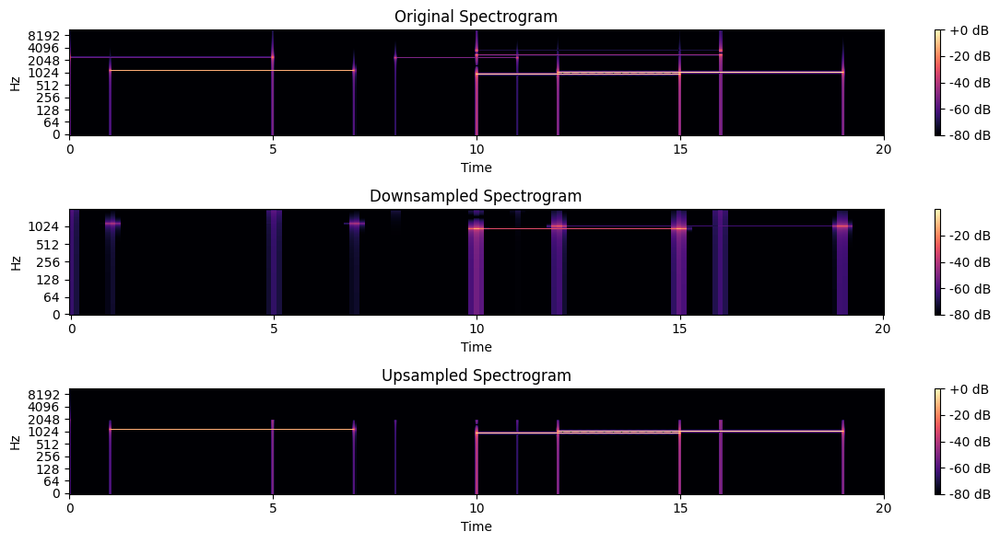

In [18]:
# Visualizing the Changes
plt.figure(figsize=(12, 6))

# Original Spectrogram
plt.subplot(3, 1, 1)
D = librosa.stft(y)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
librosa.display.specshow(S_db, sr=original_sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Original Spectrogram')

# Downsampled Spectrogram
plt.subplot(3, 1, 2)
D_downsampled = librosa.stft(y_downsampled)
S_db_downsampled = librosa.amplitude_to_db(np.abs(D_downsampled), ref=np.max)
librosa.display.specshow(S_db_downsampled, sr=target_sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Downsampled Spectrogram')

# Upsampled Spectrogram
plt.subplot(3, 1, 3)
D_upsampled = librosa.stft(y_upsampled)
S_db_upsampled = librosa.amplitude_to_db(np.abs(D_upsampled), ref=np.max)
librosa.display.specshow(S_db_upsampled, sr=original_sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Upsampled Spectrogram')

plt.tight_layout()
plt.show()

##### Question 5 [15 points]
Generate phase for your file using GriffinLim.
Show the following:
- Your waveform after stft and then istft
- Your waveform after 0 iteration of GL
- Your waveform after GL
- The difference between the original and the 0 iter version
- The difference between the original and the GM version
- The difference between the original and the stft-istft version
 - Note that doing STFT and back looses some information so you may need to crop your original vector to match the sizes

Hint:
- https://librosa.org/doc/main/generated/librosa.griffinlim.html
- How can we see the frequencies?
- What is the relationship between the sample rate and the maximum frequency detectable?

In [19]:
"""Your Code Here"""
# Perform STFT
D = librosa.stft(y)
magnitude, phase = librosa.magphase(D)  # Get magnitude and phase

# Perform ISTFT (inverse STFT) to reconstruct the audio
y_stft_istft = librosa.istft(magnitude * phase)

# Play the reconstructed audio (optional)
Audio(data=y_stft_istft, rate=sample_rate)

In [20]:
# Griffin-Lim with 0 iterations (initial phase estimate)
y_gl_0_iter = librosa.griffinlim(magnitude, n_iter=0)

# Griffin-Lim with default iterations (typically 32)
y_gl = librosa.griffinlim(magnitude)

# Play the reconstructed audio (optional)
Audio(data=y_gl_0_iter, rate=sample_rate)


In [21]:
Audio(data=y_gl, rate=sample_rate)

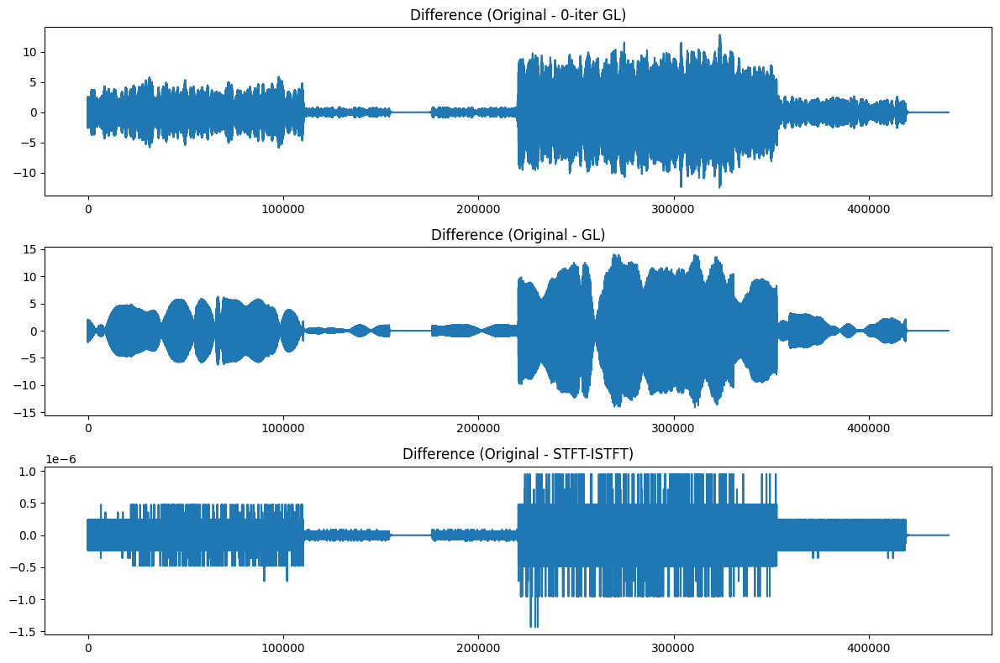

In [22]:
# Crop the original audio to match the size of the reconstructed audio
y_cropped = y[:len(y_stft_istft)]

plt.figure(figsize=(12, 8))

# Difference between original and 0-iteration GL
plt.subplot(3, 1, 1)
plt.plot(y_cropped - y_gl_0_iter)
plt.title('Difference (Original - 0-iter GL)')

# Difference between original and GL
plt.subplot(3, 1, 2)
plt.plot(y_cropped - y_gl)
plt.title('Difference (Original - GL)')

# Difference between original and STFT-ISTFT
plt.subplot(3, 1, 3)
plt.plot(y_cropped - y_stft_istft)
plt.title('Difference (Original - STFT-ISTFT)')

plt.tight_layout()
plt.show()

##### Question 6 [10 points]

Describe the difference between the Griffith & Lim and the perfect reconstruction. Does it sound similar? Can you see the difference in the waveform?

```Your Answer Here```

1. Griffin-Lim estimates the missing phase information of an audio signal, resulting in a reconstruction that sounds similar but not identical to the original. It's an approximation.

2. Perfect reconstruction would mean recovering the original signal with zero loss of information. This is rarely possible in practice.

3. Differences: Griffin-Lim audio may have subtle differences in clarity and spatial characteristics compared to the original. Perfect reconstruction would sound identical. Waveform differences also exist, but the overall shapes may look similar.

4. In our case: STFT-ISTFT loses some information, causing audible and visual differences. Griffin-Lim aims to minimize those, getting closer to the original but still not perfect.

##### Question 7 [20 points]

Please record a 2-5 minute video of yourself explaining questions 1 to 6.

If you are shy (or have a bad hairday) you can use filters to augment or cover your face. Please submit it as a public google drive url.